

We use an object detection model based on the Faster RCNN architecture to detect items from an image of the checkout counter.This notebook contains steps to train the object detector.



## Installing detectron2


---
We use Detectron2, an open source system that implements state-of-the-art object detection algorithms. It is built upon the PyTorch framework.

In [1]:
# install dependencies: (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 723.9/723.9 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 96.6 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 1.4.0+cu100 which is incompatible.
torchaudio 0.13.1+cu116 requires torch==

In [2]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 4.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 KB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61431 sha256=fa4fa0750d3f59c55253e0355a7be61bb9094bcb7dd0eb6f00237ac829c8ea27
  Stored in directory: /root/.cache/pip/wheels/b8/79/07/c0e9367f5b5ea325e246bd73651e8af175fabbef943043b1cc
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp38-cp38-linux_x86_64.whl size=

In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os
import cv2
import random
from google.colab.patches import cv2_imshow
import json

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

## Using faster rcnn config from detectron2 

---
We use a Faster RCNN based model with Resnet-101 as the feature extractor.
Detectron2's model zoo allows us to initialise our model with weights from an object detector pretrained on the MS-COCO object detection dataset.

In [4]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("Misc/mask_rcnn_R_50_FPN_1x_dconv_c3-c5.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Misc/mask_rcnn_R_50_FPN_1x_dconv_c3-c5.yaml")
cfg.MODEL.TYPE = "MaskRCNN"
cfg.MODEL.MASK_ON = False
cfg.MODEL.ROI_MASK_HEAD = "MaskRCNN"
pred = DefaultPredictor(cfg)

model_final_65c703.pkl: 180MB [00:12, 13.9MB/s]                           
  roi_heads.mask_head.mask_fcn1.{bias, weight}
  roi_heads.mask_head.mask_fcn2.{bias, weight}
  roi_heads.mask_head.mask_fcn3.{bias, weight}
  roi_heads.mask_head.mask_fcn4.{bias, weight}
  roi_heads.mask_head.deconv.{bias, weight}
  roi_heads.mask_head.predictor.{bias, weight}


## Preparing the dataset

---
Training images and their ground truth annotations in COCO format are contained in `traindata2019` folder and `train.json` file respectively.

In [5]:
# Mounting drive so that shared folder can be used
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [6]:
# Replace with path to the shared folder in your drive
root_path = "/content/drive/MyDrive/self_checkout"

In [7]:
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer

#Reading train and test data in COCO format
register_coco_instances("rpc_train", {}, os.path.join(root_path,"train.json"), os.path.join(root_path,"traindata2019"))
register_coco_instances("rpc_test", {}, os.path.join(root_path,"test.json"), os.path.join(root_path,"testdata2019"))

rpc_train_metadata = MetadataCatalog.get("rpc_train")
rpc_test_metadata = MetadataCatalog.get("rpc_test")


**Please note the following cell may give an error. This is because of colab instance timeout due to large number of images in test set. Please try running the cell again or restarting the runtime.**

[02/11 10:59:47 d2.data.datasets.coco]: Loading /content/drive/MyDrive/self_checkout/test.json takes 4.74 seconds.
[02/11 10:59:47 d2.data.datasets.coco]: Loaded 6000 images in COCO format from /content/drive/MyDrive/self_checkout/test.json


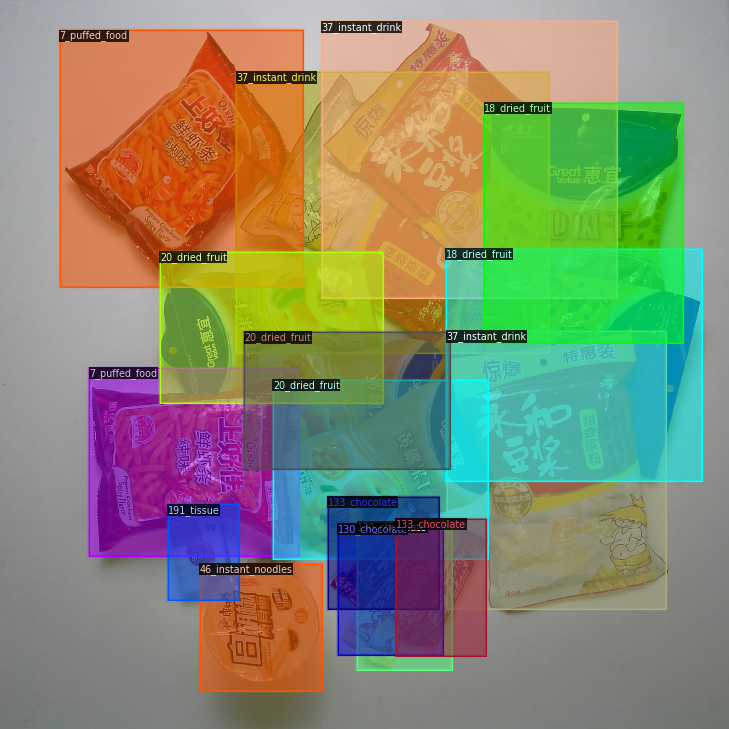

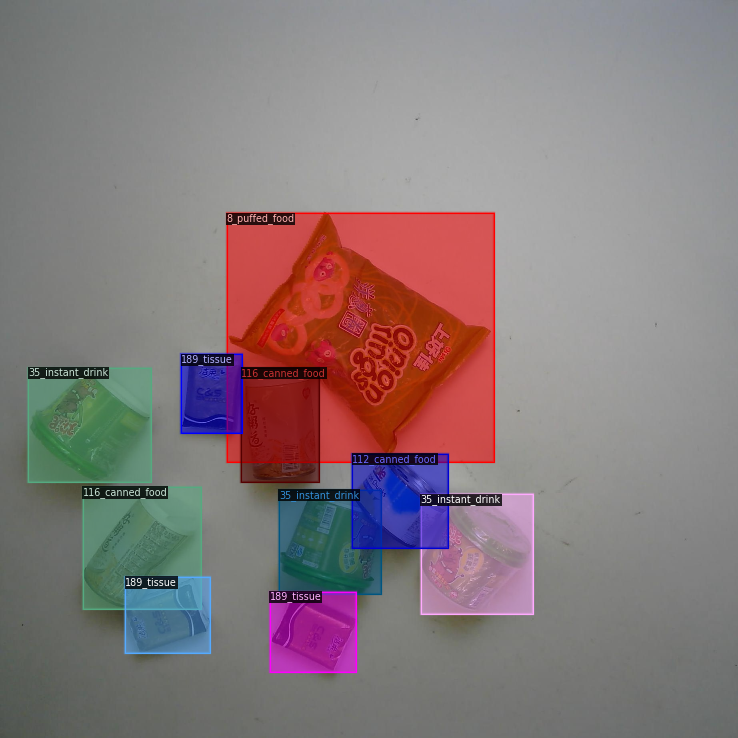

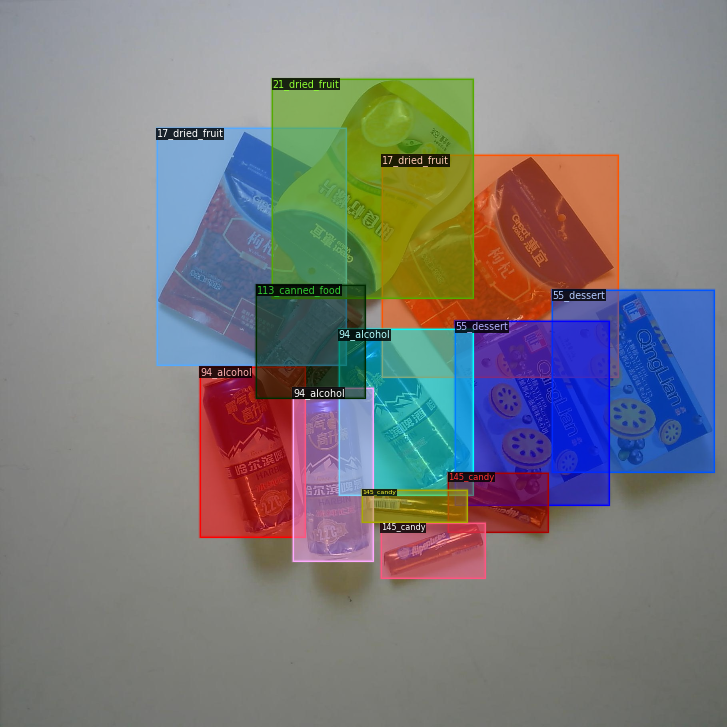

In [8]:
#Visualize 3 samples from the test data
dataset_dicts = DatasetCatalog.get("rpc_test")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=rpc_test_metadata, scale=0.4)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Training

We initialise training from pretrained weights in the detectron2 model zoo. Training this on the RPC dataset for 5000 epochs takes around 2 hrs.
Training curves are visualized using TensorBoard.

The trained model is found in the `output` folder.

In [9]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("Misc/mask_rcnn_R_50_FPN_1x_dconv_c3-c5.yaml"))
cfg.DATASETS.TRAIN = ("rpc_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Misc/mask_rcnn_R_50_FPN_1x_dconv_c3-c5.yaml")  # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  
cfg.SOLVER.MAX_ITER = 12000    # For better results change to 5000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # 128 images per batch
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 200  # The RPC dataset contains 200 product categories
cfg.MODEL.DEVICE = 'cuda'
cfg.OUTPUT_DIR = '/content/drive/MyDrive/Faster_RCNN/'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True) # The trained model and chekcpoints will be saved in the folder /content/output
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False) # Load weights from model zoo
trainer.train()

[02/11 11:01:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[02/11 11:01:16 d2.engine.train_loop]: Starting training from iteration 0
[02/11 11:03:18 d2.utils.events]:  eta: 2:54:42  iter: 19  total_loss: 6.901  loss_cls: 5.238  loss_box_reg: 0.892  loss_mask: 0.693  loss_rpn_cls: 0.029  loss_rpn_loc: 0.043  time: 0.8871  data_time: 5.7562  lr: 0.000050  max_mem: 2049M
[02/11 11:03:36 d2.utils.events]:  eta: 2:55:20  iter: 39  total_loss: 5.773  loss_cls: 4.087  loss_box_reg: 0.893  loss_mask: 0.692  loss_rpn_cls: 0.028  loss_rpn_loc: 0.043  time: 0.8872  data_time: 0.5877  lr: 0.000100  max_mem: 2049M
[02/11 11:03:54 d2.utils.events]:  eta: 2:55:54  iter: 59  total_loss: 3.569  loss_cls: 1.900  loss_box_reg: 0.929  loss_mask: 0.690  loss_rpn_cls: 0.021  loss_rpn_loc: 0.034  time: 0.8928  data_time: 0.5950  lr: 0.000150  max_mem: 2049M
[02/11 11:04:11 d2.utils.events]:  eta: 2:55:58  iter: 79  total_loss: 3.364  loss_cls: 1.713  loss_box_reg: 0.920  loss_mask: 0.689  loss_rpn_cls: 0.011  loss_rpn_loc: 0.039  time: 0.8895  data_time: 0.5775  lr:

In [10]:
import pickle
cfg_save_path='/content/drive/MyDrive/Faster_RCNN/mask_save.pkl'
with open(os.path.join(cfg.OUTPUT_DIR,cfg_save_path),'wb') as f:
    pickle.dump(cfg,f,protocol=pickle.HIGHEST_PROTOCOL)

In [11]:
with open(os.path.join(cfg.OUTPUT_DIR,cfg_save_path),'rb') as f:
    cfg=pickle.load(f)
cfg.MODEL.WEIGHTS=os.path.join(cfg.OUTPUT_DIR,"model_final.pth")
print(cfg.MODEL.WEIGHTS)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST=0.5
predictor=DefaultPredictor(cfg)

/content/drive/MyDrive/Faster_RCNN/model_final.pth


In [15]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

[02/11 14:00:37 d2.data.datasets.coco]: Loading /content/drive/MyDrive/self_checkout/test.json takes 1.68 seconds.
[02/11 14:00:38 d2.data.datasets.coco]: Loaded 6000 images in COCO format from /content/drive/MyDrive/self_checkout/test.json
/content/drive/MyDrive/self_checkout/testdata2019/20180914-09-34-52-566.jpg


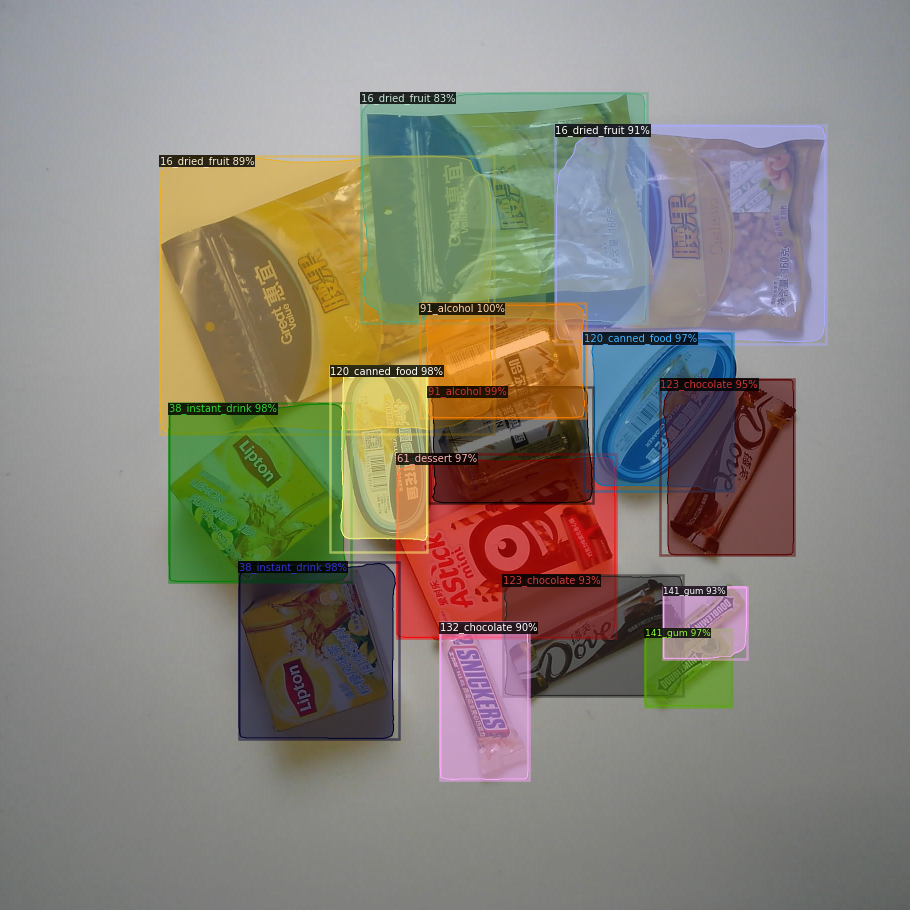

/content/drive/MyDrive/self_checkout/testdata2019/20180914-15-47-23-711.jpg


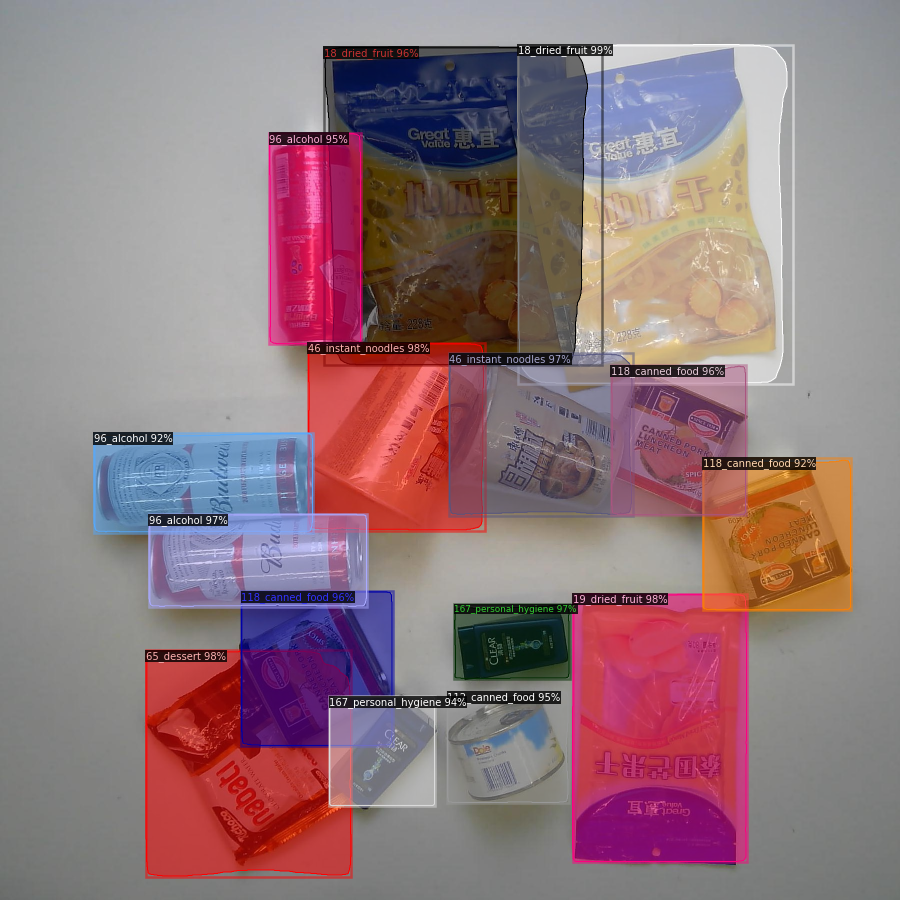

/content/drive/MyDrive/self_checkout/testdata2019/20180829-14-34-37-1356.jpg


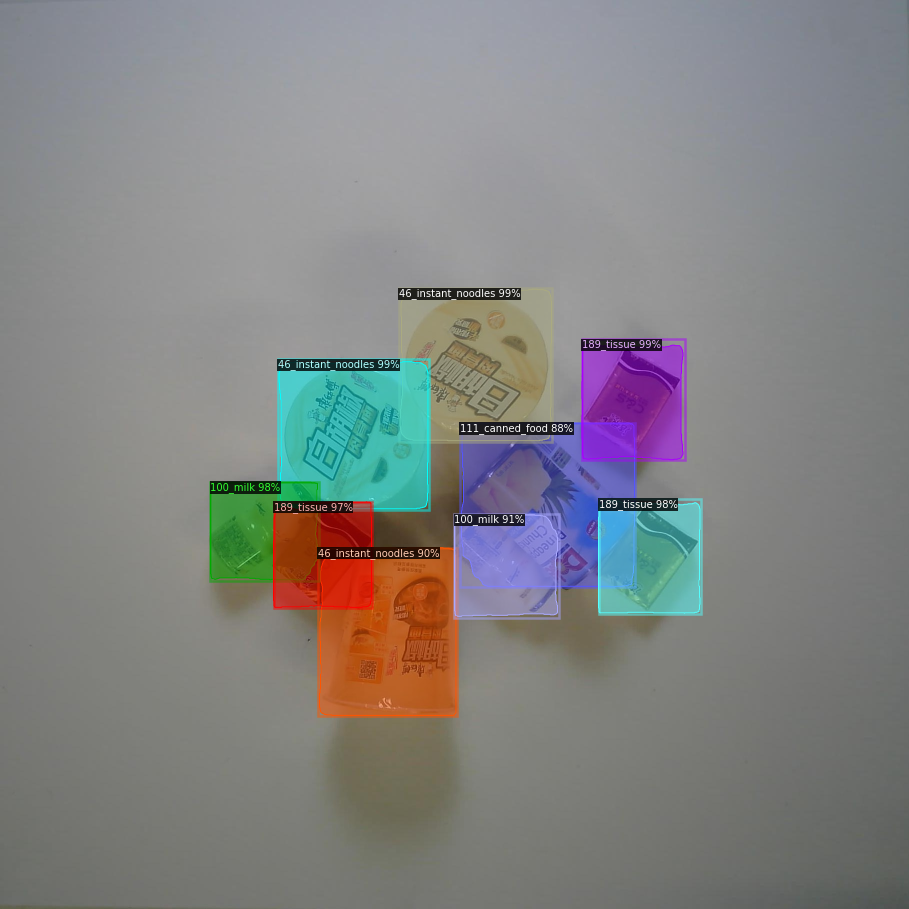

/content/drive/MyDrive/self_checkout/testdata2019/20180827-14-26-24-226.jpg


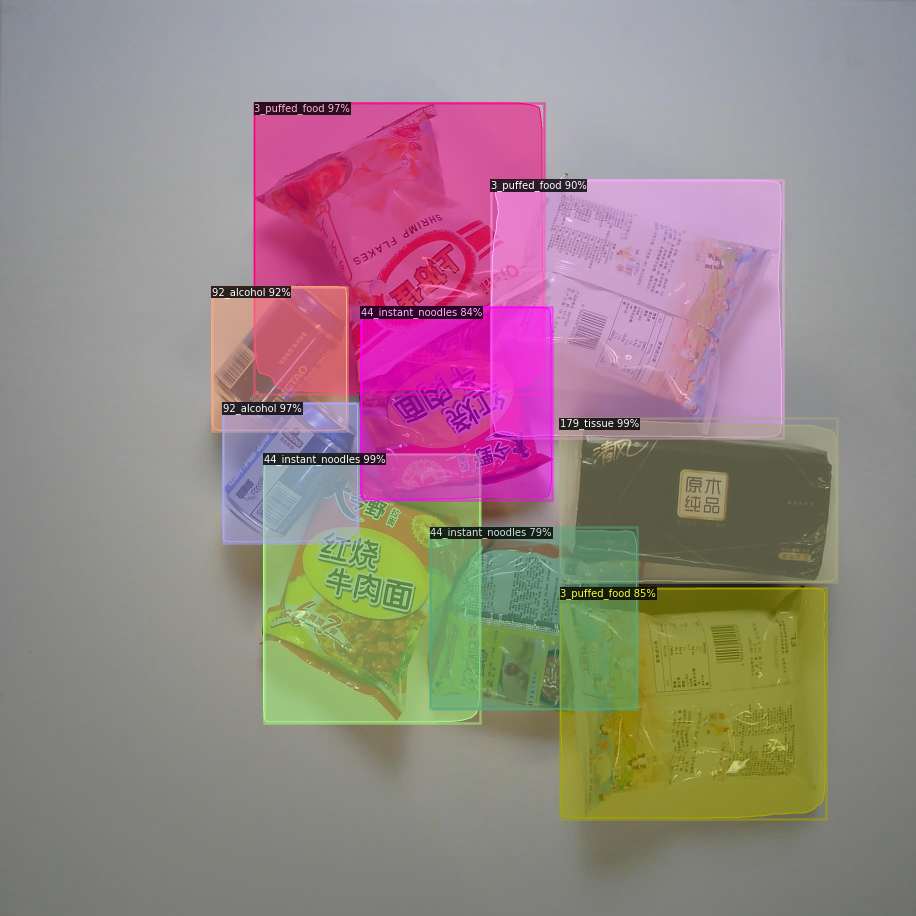

/content/drive/MyDrive/self_checkout/testdata2019/20181018-10-14-15-2311.jpg


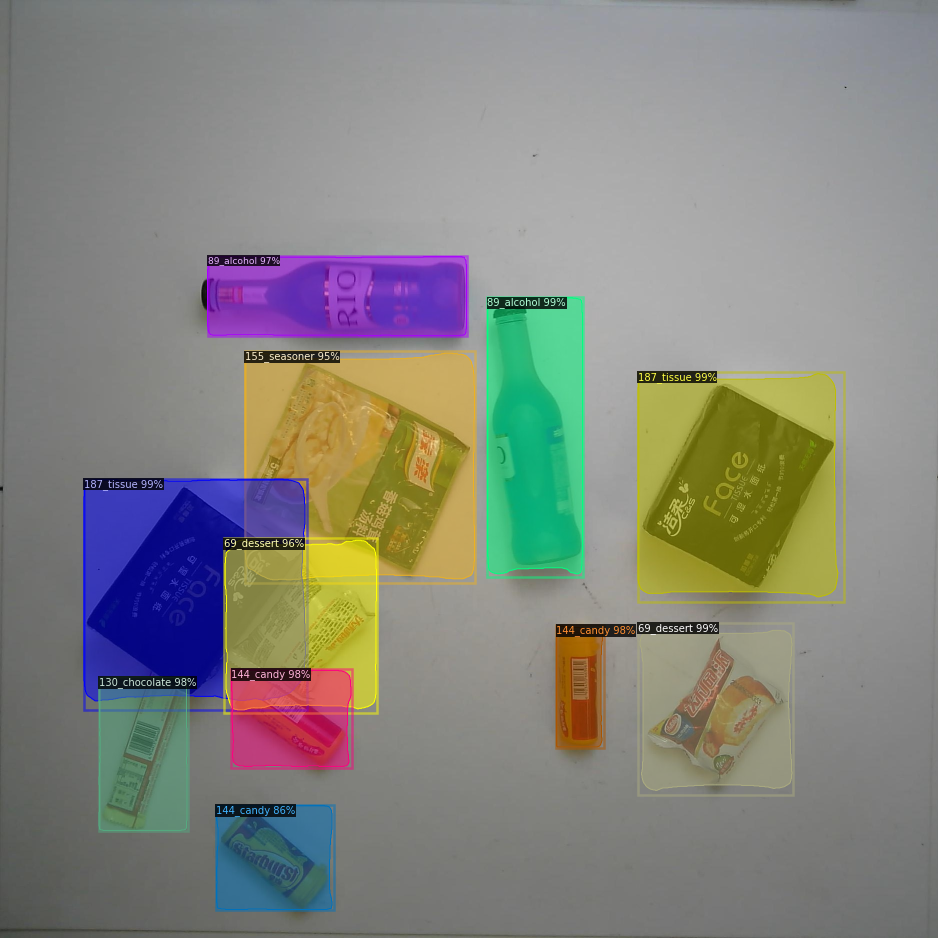

In [13]:
# Visualizing detections in images randomly sampled from the test set  
dataset_dicts = DatasetCatalog.get("rpc_test")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(d["file_name"])
    v = Visualizer(im[:, :, ::-1],
                   metadata=rpc_test_metadata, 
                   scale=0.5, 
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

## Testing performance of trained model : 


---
The above trained model is tested on images randomly sampled from the test dataset.


In [39]:
# Create Default Predictor
from detectron2.engine import DefaultTrainer,DefaultPredictor
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("Misc/mask_rcnn_R_50_FPN_1x_dconv_c3-c5.yaml"))
cfg.DATASETS.TRAIN = ("rpc_train",)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 200
cfg.OUTPUT_DIR = '/content/drive/MyDrive/Faster_RCNN/'
cfg.MODEL.WEIGHTS = os.path.join('/content/drive/MyDrive/Faster_RCNN','model_final.pth')
# Uncomment the below line to use an object detector which has already been trained for 5000 epochs
# cfg.MODEL.WEIGHTS = os.path.join(root_path,"smart_billing_model/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set the testing threshold for this model. For a model trained for 1000 epochs set to 0.3 to see results. 
cfg.DATASETS.TEST = ("rpc_test", )
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
predictor = DefaultPredictor(cfg)

[02/11 14:59:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [23]:
import random
random.uniform(10.5, 75.5)
price=dict()
product_names = rpc_test_metadata.thing_classes
for val in product_names:
  price[val]=np.round(np.random.uniform(10.5, 75.5),2)

In [22]:
from random import randrange
from datetime import timedelta

def random_date(start, end):
    """
    This function will return a random datetime between two datetime 
    objects.
    """
    delta = end - start
    int_delta = delta.days
    random_second = randrange(int_delta)
    return start + timedelta(days=random_second)

In [21]:
def calculate_discount(x):
  d = x-datetime.today() 
  if d.days<=1:
    return 90
  elif d.days<=30:
    return 80
  elif d.days<=60:
    return 70
  elif d.days<=90:
    return 60
  elif d.days<=120:
    return 50
  elif d.days<=150:
    return 40
  elif d.days<=180:
    return 30
  elif d.days<=240:
    return 20
  elif d.days<=270:
    return 10
  else:
    return 0

In [20]:
# Util function to display list of names of detected items 
product_names = rpc_test_metadata.thing_classes
def create_list(instances):
  det_items = [product_names[i] for i in instances]
  return det_items

In [16]:
import pandas as pd
from datetime import datetime
def get_price(x):
  data=pd.DataFrame(columns=['product','quantity','Expiry','discount in %','price','Net_price'])
  product=[]
  quantity=[]
  discount=[]
  Expiry=[]
  value_price=[]
  Net_price=[]
  d1 = datetime.strptime('02/08/2022', '%d/%m/%Y')
  d2 = datetime.strptime('02/08/2023', '%d/%m/%Y')
  list_mapping=dict()
  for val in x:
    if list_mapping.get(val) is None:
      list_mapping[val]=1
    else:
      list_mapping[val]+=1
  for k, v in list_mapping.items():
    product.append(k)
    quantity.append(list_mapping[k])
    x=random_date(start=d1, end=d2)
    Expiry.append(x)
    y=calculate_discount(x)
    discount.append(y)
    value_price.append(price[k])
    z=list_mapping[k]*price[k]
    Net_price.append(z-(y/100)*z)
  data['product']=product
  data['quantity']=quantity
  data['Expiry']=Expiry
  data['discount in %']=discount
  data['price']=value_price
  data['Net_price']=Net_price
  return data

In [17]:
!pip install qrcode

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.2/46.2 KB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 KB 8.0 MB/s eta 0:00:00


In [18]:
!pip install pyqrcode

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 KB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyqrcode: filename=PyQRCode-1.2.1-py3-none-any.whl size=36245 sha256=9c5a1804be04c257154921cd0c85497cc6702b536990e4ca5e4c9925f5493032
  Stored in directory: /root/.cache/pip/wheels/e6/5e/b1/e42b38f43c94593ea57059de7e585c009c0f54e36e1a532992
Successfully built pyqrcode


[02/11 14:08:24 d2.data.datasets.coco]: Loaded 6000 images in COCO format from /content/drive/MyDrive/self_checkout/test.json
/content/drive/MyDrive/self_checkout/testdata2019/20180824-16-46-31-76.jpg


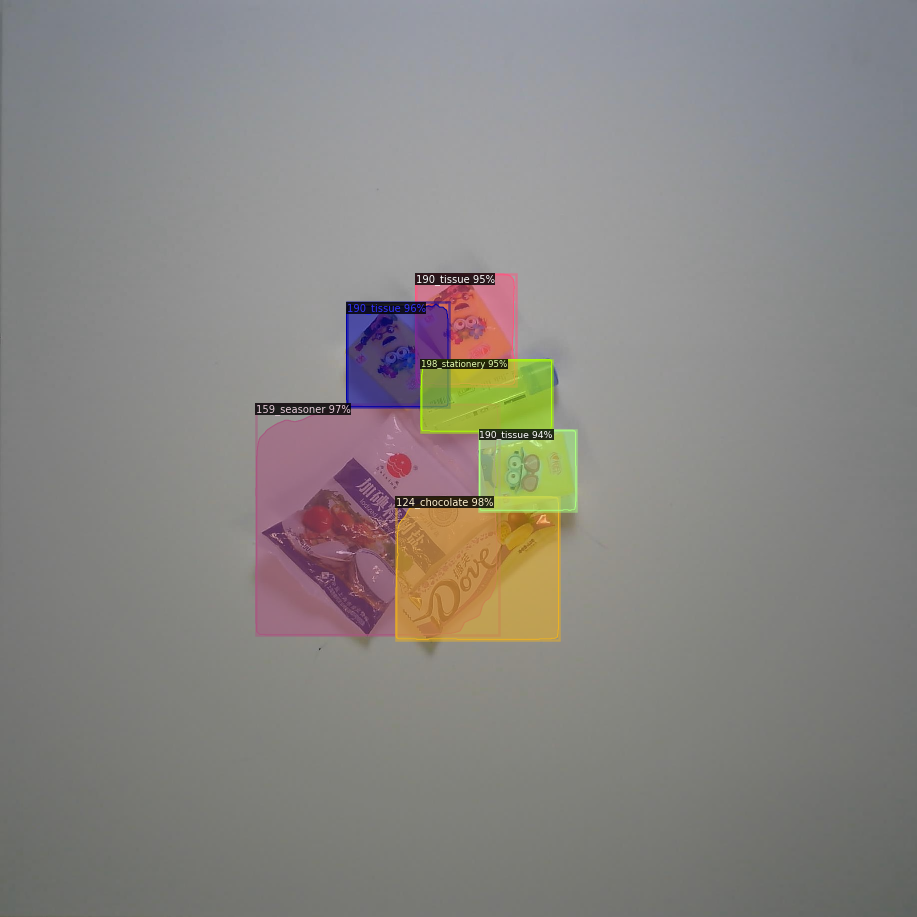

          product  quantity     Expiry  discount in %  price  Net_price
0   124_chocolate         1 2023-07-24             30  26.16     18.312
1    159_seasoner         1 2022-09-04             90  25.81      2.581
2      190_tissue         3 2022-10-02             90  73.07     21.921
3  198_stationery         1 2023-05-20             50  21.83     10.915
Total Amount:  53.73


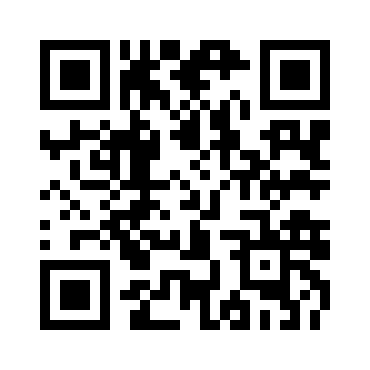

/content/drive/MyDrive/self_checkout/testdata2019/20181017-15-29-29-2241.jpg


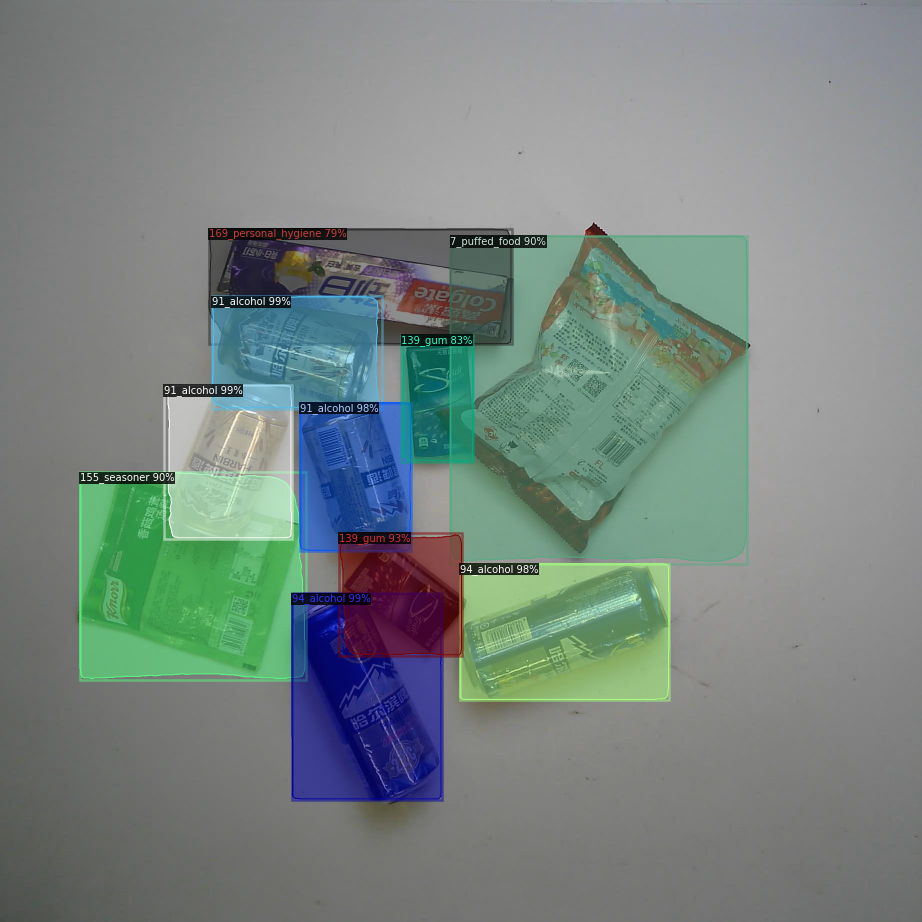

                product  quantity     Expiry  discount in %  price  Net_price
0            91_alcohol         3 2022-10-22             90  25.54      7.662
1            94_alcohol         2 2023-05-28             50  50.69     50.690
2               139_gum         2 2023-07-29             30  65.13     91.182
3          155_seasoner         1 2022-08-22             90  24.28      2.428
4         7_puffed_food         1 2022-10-09             90  27.94      2.794
5  169_personal_hygiene         1 2023-06-17             40  62.18     37.308
Total Amount:  192.06


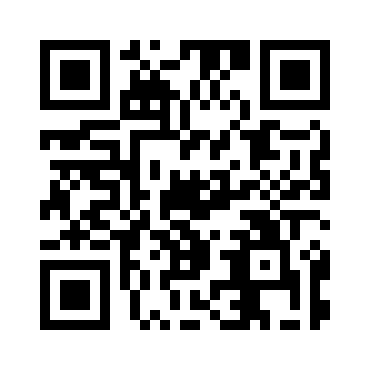

/content/drive/MyDrive/self_checkout/testdata2019/20180906-14-08-49-381.jpg


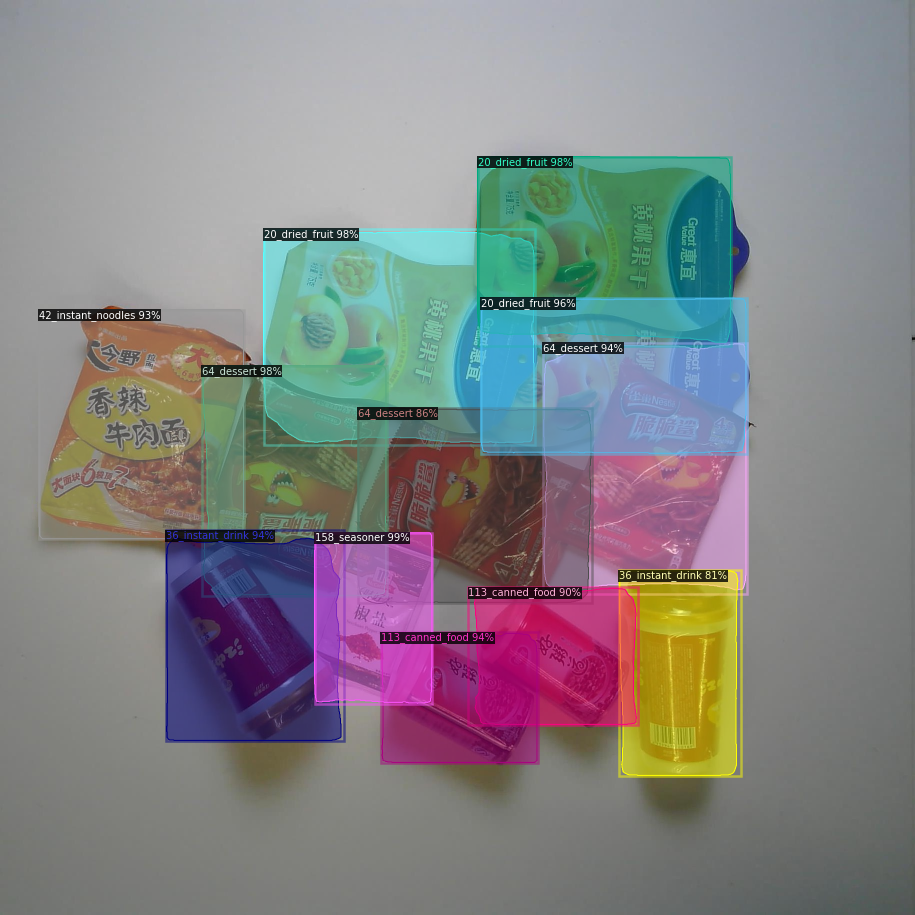

              product  quantity     Expiry  discount in %  price  Net_price
0        158_seasoner         1 2022-10-26             90  14.53      1.453
1          64_dessert         3 2022-09-04             90  29.20      8.760
2      20_dried_fruit         3 2023-07-25             30  52.42    110.082
3     113_canned_food         2 2023-01-03             90  11.29      2.258
4    36_instant_drink         2 2022-10-06             90  51.21     10.242
5  42_instant_noodles         1 2022-11-27             90  12.31      1.231
Total Amount:  134.03


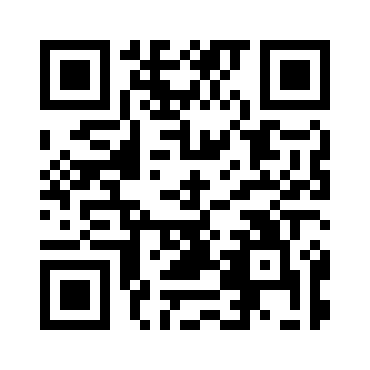

/content/drive/MyDrive/self_checkout/testdata2019/20180828-09-07-21-351.jpg


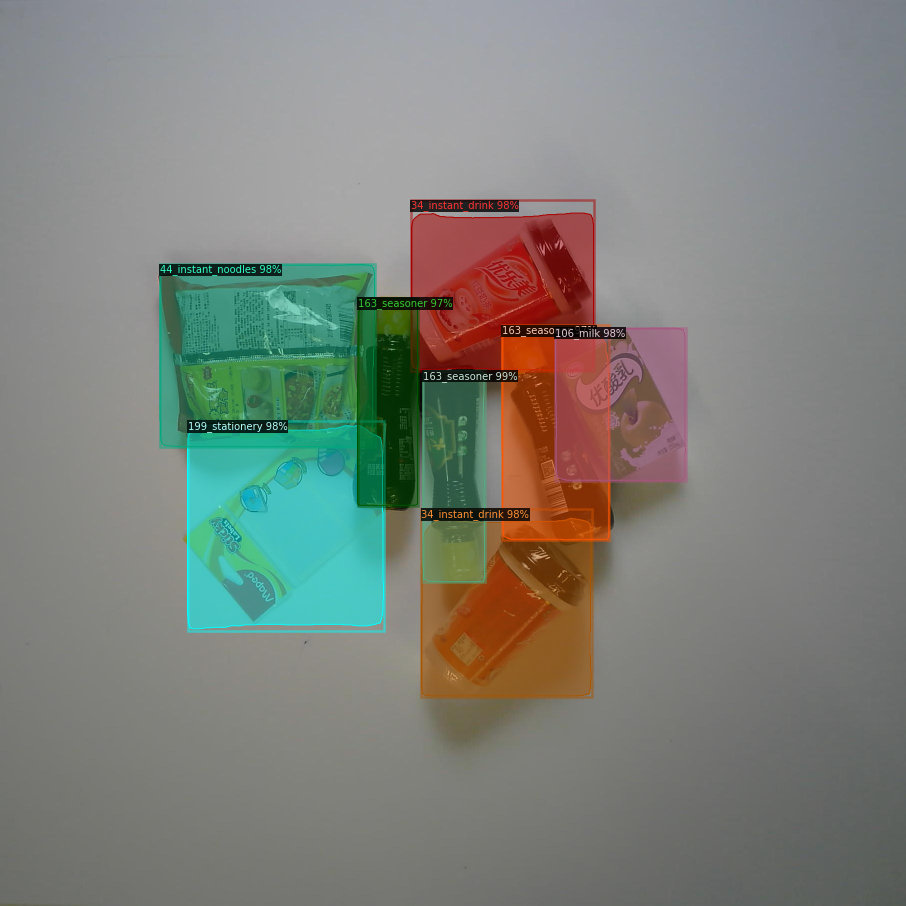

              product  quantity     Expiry  discount in %  price  Net_price
0        163_seasoner         3 2022-12-09             90  34.98     10.494
1      199_stationery         1 2023-02-15             80  52.00     10.400
2    34_instant_drink         2 2023-02-15             80  64.57     25.828
3  44_instant_noodles         1 2023-06-02             50  30.25     15.125
4            106_milk         1 2023-02-16             80  69.13     13.826
Total Amount:  75.67


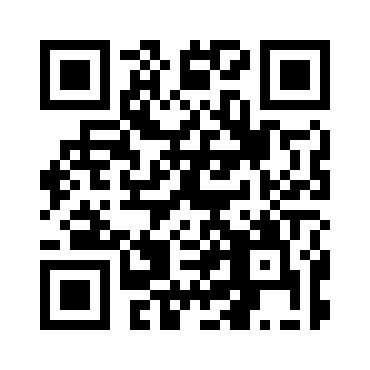

/content/drive/MyDrive/self_checkout/testdata2019/20181015-10-19-52-1466.jpg


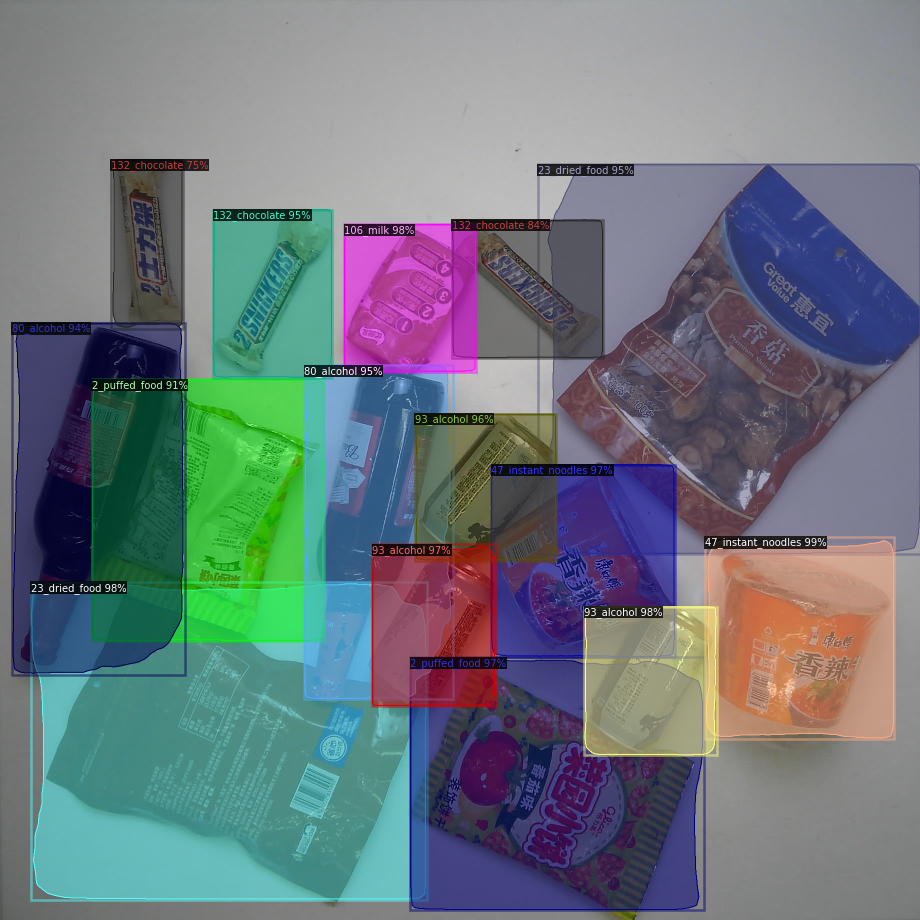

              product  quantity     Expiry  discount in %  price  Net_price
0  47_instant_noodles         2 2023-02-11             90  65.42     13.084
1       23_dried_food         2 2022-09-28             90  11.28      2.256
2          93_alcohol         3 2022-12-24             90  31.60      9.480
3            106_milk         1 2023-04-04             70  69.13     20.739
4       2_puffed_food         2 2022-09-26             90  17.09      3.418
5       132_chocolate         3 2022-12-23             90  16.51      4.953
6          80_alcohol         2 2023-07-09             40  46.17     55.404
Total Amount:  109.33


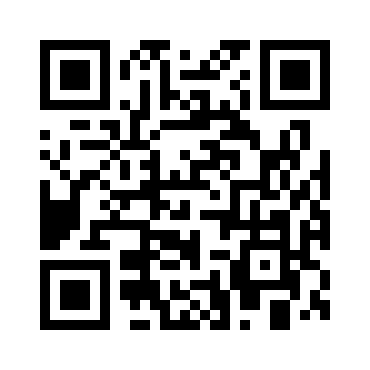

In [26]:
# Visualizing detections in images randomly sampled from the test set  
import qrcode
import pyqrcode
dataset_dicts = DatasetCatalog.get("rpc_test")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(d["file_name"])
    v = Visualizer(im[:, :, ::-1],
                   metadata=rpc_test_metadata, 
                   scale=0.5, 
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    items = outputs["instances"].pred_classes.cpu().detach().numpy()
    items = list(items)
    items=create_list(items)
    data=get_price(items)
    s='Total amount pay {}'.format(np.round(sum(data['Net_price']),2))
    qr = qrcode.QRCode(
    version=1,
    error_correction=qrcode.constants.ERROR_CORRECT_H,
    box_size=10,
    border=4,
    )
    qr.add_data(s)
    qr.make(fit=True)
    img = qr.make_image(fill_color="black", back_color="white").convert('RGB')
    img.save("sample.png")
    img=cv2.imread("sample.png")
    #cv2_imshow()
    print(data)
    print('Total Amount: ',np.round(sum(data['Net_price']),2))
    cv2_imshow(img)

In [27]:
# Running inference on test data, to get test metrics
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("rpc_test", cfg, False, output_dir="/content/drive/MyDrive/RCNN/")
val_loader = build_detection_test_loader(cfg, "rpc_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[02/11 14:09:25 d2.data.datasets.coco]: Loading /content/drive/MyDrive/self_checkout/test.json takes 1.75 seconds.
[02/11 14:09:25 d2.data.datasets.coco]: Loaded 6000 images in COCO format from /content/drive/MyDrive/self_checkout/test.json
[02/11 14:09:25 d2.data.build]: Distribution of instances among all 200 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| 1_puffed_food | 252          | 2_puffed_food | 421          | 3_puffed_food | 230          |
| 4_puffed_food | 474          | 5_puffed_food | 347          | 6_puffed_food | 433          |
| 7_puffed_food | 465          | 8_puffed_food | 516          | 9_puffed_food | 355          |
| 10_puffed_f.. | 407          | 11_puffed_f.. | 531          | 12_puffed_f.. | 332          |
| 13_dried_fr.. | 331          | 14_dried_fr.. | 317          | 15_dried_fr.. | 418          |
| 16_dried

OrderedDict([('bbox',
              {'AP': 73.3267303618049,
               'AP50': 96.36628618699092,
               'AP75': 90.20378937425292,
               'APs': 0.0,
               'APm': 0.0,
               'APl': 73.330263858662,
               'AP-1_puffed_food': 58.74751673130261,
               'AP-2_puffed_food': 79.22185440484843,
               'AP-3_puffed_food': 79.44353953569477,
               'AP-4_puffed_food': 76.98324358998089,
               'AP-5_puffed_food': 82.96138669241597,
               'AP-6_puffed_food': 78.01541502106922,
               'AP-7_puffed_food': 82.51086066675123,
               'AP-8_puffed_food': 68.07267194899876,
               'AP-9_puffed_food': 79.0013450555405,
               'AP-10_puffed_food': 83.02536732135974,
               'AP-11_puffed_food': 83.00637022301433,
               'AP-12_puffed_food': 84.53469411385917,
               'AP-13_dried_fruit': 70.47797685405882,
               'AP-14_dried_fruit': 49.47095374165528,
  

# Metrics Calculation

In [28]:
import concurrent.futures
import cv2
import pandas as pd
from tqdm import tqdm

def give_products(outputs):
    pred_classes = outputs['instances'].pred_classes.cpu().tolist()
    return pred_classes

def process_image(d):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    return d["file_name"], [d['annotations'][i]['category_id'] for i in range(len(d['annotations']))], give_products(outputs)

def process_batch(dataset_dicts):
    with concurrent.futures.ThreadPoolExecutor() as executor:
        results = [executor.submit(process_image, d) for d in dataset_dicts]
    return [r.result() for r in results]

def reduce_time_complexity(dataset_dicts, batch_size=128):
    data = pd.DataFrame(columns=['file_name'])
    num_batches = len(dataset_dicts) // batch_size + (len(dataset_dicts) % batch_size != 0)
    for i in tqdm(range(num_batches)):
        start = i * batch_size
        end = min(len(dataset_dicts), (i + 1) * batch_size)
        batch = dataset_dicts[start:end]
        results = process_batch(batch)
        file_name, actual, pred = zip(*results)
        data = data.append(pd.DataFrame({'file_name': file_name, 'actual': actual, 'prediction': pred}))
    return data


dataset_dicts = DatasetCatalog.get("rpc_test")
data = reduce_time_complexity(dataset_dicts)
data.head()


[02/11 14:41:48 d2.data.datasets.coco]: Loaded 6000 images in COCO format from /content/drive/MyDrive/self_checkout/test.json


100%|██████████| 47/47 [14:35<00:00, 18.62s/it]


,file_name,actual,prediction
0,/content/drive/MyDrive/self_checkout/testdata2...,"[95, 110, 86, 86]","[86, 95, 86, 110]"
1,/content/drive/MyDrive/self_checkout/testdata2...,"[86, 86, 95, 110]","[95, 86, 86, 110]"
2,/content/drive/MyDrive/self_checkout/testdata2...,"[151, 151, 59, 32]","[151, 151, 32, 59]"
3,/content/drive/MyDrive/self_checkout/testdata2...,"[59, 151, 151, 32]","[151, 32, 151, 59]"
4,/content/drive/MyDrive/self_checkout/testdata2...,"[151, 59, 32, 151]","[151, 32, 59, 151]"


In [29]:
data.to_json('/content/drive/MyDrive/Faster_RCNN/mask_rcnn.json', orient="split")

In [30]:
import pandas as pd
data = pd.read_json('/content/drive/MyDrive/Faster_RCNN/mask_rcnn.json', orient='split')
data.head()

,file_name,actual,prediction
0,/content/drive/MyDrive/self_checkout/testdata2...,"[95, 110, 86, 86]","[86, 95, 86, 110]"
1,/content/drive/MyDrive/self_checkout/testdata2...,"[86, 86, 95, 110]","[95, 86, 86, 110]"
2,/content/drive/MyDrive/self_checkout/testdata2...,"[151, 151, 59, 32]","[151, 151, 32, 59]"
3,/content/drive/MyDrive/self_checkout/testdata2...,"[59, 151, 151, 32]","[151, 32, 151, 59]"
4,/content/drive/MyDrive/self_checkout/testdata2...,"[151, 59, 32, 151]","[151, 32, 59, 151]"


In [35]:
from collections import Counter
def list_to_dict(lst):
    lst = [lst.count(x) for x in range(200)]
    return lst

In [36]:
pred=dict()
actual = dict()
for index, row in data.iterrows():
  pred[row['file_name']] = list_to_dict(row['prediction'])
  actual[row['file_name']] = list_to_dict(row['actual'])


In [37]:
import json
import numpy as np
from collections import defaultdict


def calculate(predictions, labels, log=True):
    # Inputs Example:
    # predictions = {'file1':[0,0,1], 'file2':[0,0,2], 'file3':[1,1,2], 'file4':[2,3,3]}
    # labels = {'file1':[0,0,1], 'file2':[0,1,1], 'file3':[1,0,2], 'file4':[0,0,2]}

    pred_keys, pred_values = list(predictions.keys()), np.array(list(predictions.values())).astype(np.float32)
    label_values  = np.array([ labels[key] for key in pred_keys ]).astype(np.float32)

    N = len(predictions)
    K = len(labels[pred_keys[0]])

    score_1 = score1(pred_values, label_values, N)
    score_2 = score2(pred_values, label_values, N)
    score_3 = score3(pred_values, label_values, N)
    score_4 = score4(pred_values, label_values, K)
    score_5 = score5(pred_values, label_values, K)    
    if log:
        print('Score1 is {:.4f}, Score2 is {:.4f}, Score3 is {:.4f}, Score4 is {:.4f}, Score5 is {:.4f}'.format(score_1, score_2, score_3, score_4, score_5))
    return dict(cAcc=score_1, ACD=score_2, score_3=score_3, mCCD=score_4, mCIoU=score_5)

def evaluate(pred_counts, gt_counts, log=True, K=200):
    predictions = defaultdict(lambda :[0]*K)
    labels = defaultdict(lambda :[0]*K)
    for k,vs in pred_counts.items():
        for v in vs:
            predictions[k][v] += 1
    for k,vs in gt_counts.items():
        for v in vs:
            labels[k][v] += 1
    return calculate(predictions, labels, log=log)

def score1(pred_values, label_values, N):
    return np.sum(np.all(np.equal(label_values, pred_values), axis=1)) / N


def score2(pred_values, label_values, N):
    return np.sum(np.abs(label_values - pred_values)) / N


def score3(pred_values, label_values, N):
    total_cd = np.sum(np.abs(label_values - pred_values), axis=1)
    total_gd = np.sum(label_values, axis=1)
    return np.sum(np.divide(total_cd, total_gd)) / N


def score4(pred_values, label_values, K):
    class_cd = np.sum(np.abs(label_values - pred_values), axis=0)
    class_gt = np.sum(label_values, axis=0)
    return np.sum(np.divide(class_cd, class_gt)) / K

def score5(pred_values, label_values, K):
    minimum = np.minimum(pred_values, label_values)
    maximum = np.maximum(pred_values, label_values)
    class_minimum = np.sum(minimum, axis=0)
    class_maximum = np.sum(maximum, axis=0)
    return np.sum(np.divide(class_minimum, class_maximum)) / K

#12000 epochs

In [38]:
print(calculate(pred, actual))

Score1 is 0.6975, Score2 is 0.4980, Score3 is 0.0391, Score4 is 0.0402, Score5 is 0.9608
{'cAcc': 0.6975, 'ACD': 0.498, 'score_3': 0.03907657877604167, 'mCCD': 0.04015176773071289, 'mCIoU': 0.9608231353759765}


### 10000 epochs

In [ ]:
print(calculate(pred, actual))

Score1 is 0.6512, Score2 is 0.5638, Score3 is 0.0455, Score4 is 0.0449, Score5 is 0.9580
{'cAcc': 0.6511666666666667, 'ACD': 0.5638333333333333, 'score_3': 0.04548008728027344, 'mCCD': 0.044931192398071286, 'mCIoU': 0.9580256652832031}


### 5000 epochs

In [ ]:
print(calculate(pred, actual))

Score1 is 0.3975, Score2 is 1.5545, Score3 is 0.1253, Score4 is 0.1234, Score5 is 0.8912
{'cAcc': 0.3975, 'ACD': 1.5545, 'score_3': 0.12530305989583335, 'mCCD': 0.12337935447692872, 'mCIoU': 0.8911994171142578}
